# Overview

El propósito de este caso es producir un modelo de clasificaión capaz de predecir el tipo de alojamiennto requerido por el viajero/viajeros de acuerdo a ciertas caracteristicas proporcionadas en un dataset.

El approach selecionado será entrenar diversos modelos para ver el performance y selecionar el modelo que mejor desempeño tenga. El schema del producto incluirá el análisis exploratorio, el procesamiento de los datos, el modelado, la comparación de modelos y un análisis de resultados.


# Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
from scipy import stats
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import cross_val_predict, cross_val_score, train_test_split, GridSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report, confusion_matrix, roc_curve, auc




# Load Data

El conjunto de datos proviene de una agencia de viajes en un archivo de texto 
llamado train_data.txt. Para cada registro, se proporcionan 7 atributos en el siguiente orden: 
- "id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType" 

Descripción Corta: 
- id único del viaje 
- duración del viaje (en días) 
- género de la persona que reservó 
- edad de la persona que reservó (en años) 
- niños en el grupo de viaje (true/false) 
- código del país de destino 
- tipo de alojamiento (departamento/hotel)  

In [ ]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

# EDA

### Basic Info

In [ ]:
# Get summary information about the dataset
print(df.info())

### Variable Distributions

In [ ]:
# Plot distribution for 'durationOfStay', 'age', and 'kids'
plt.figure(figsize=(14, 10))

# Duration of stay
plt.subplot(2, 3, 1)
sns.histplot(data=df, x='durationOfStay', bins=20, kde=True, alpha=0.5, color='blue')
plt.title('Duration of Stay Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age
plt.subplot(2, 3, 2)
sns.histplot(data=df, x='age', bins=20, kde=True, alpha=0.5, color='green')
plt.title('Age Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids
plt.subplot(2, 3, 3)
acom_plot = sns.countplot(data=df, x='kids', alpha=0.5, color='orange')
plt.title('kids')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts above bars for Accommodation Type
for bar in acom_plot.patches:
    count = int(bar.get_height())
    acom_plot.annotate(f'{count}', (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                       ha='center', va='bottom', fontsize=9, color='black')

# Gender
plt.subplot(2, 3, 4)
gender_plot = sns.countplot(data=df, x='gender', alpha=0.5, color='blue')
plt.title('Gender Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts above bars for Gender
for bar in gender_plot.patches:
    count = int(bar.get_height())
    gender_plot.annotate(f'{count}', (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                         ha='center', va='bottom', fontsize=9, color='black')

# Destination Code
plt.subplot(2, 3, 5)
destination_plot = sns.countplot(data=df, x='destinationCode', alpha=0.5, color='green')
plt.title('Destination Code Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts above bars for Destination Code
for bar in destination_plot.patches:
    count = int(bar.get_height())
    destination_plot.annotate(f'{count}', (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                               ha='center', va='bottom', fontsize=9, color='black')

# Accommodation Type
plt.subplot(2, 3, 6)
acom_plot = sns.countplot(data=df, x='acomType', alpha=0.5, color='orange')
plt.title('Accommodation Type Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add counts above bars for Accommodation Type
for bar in acom_plot.patches:
    count = int(bar.get_height())
    acom_plot.annotate(f'{count}', (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                       ha='center', va='bottom', fontsize=9, color='black')

# Adjust layout for better display
plt.tight_layout()
plt.show()


In [ ]:
# Get basic statistics
print(df.describe())

### Missing Values

In [ ]:
# Check for missing values
print(df.isnull().sum())

In [ ]:

# Check missing values grouped by durationOfStay
missing_by_agdurationOfStay = df.groupby('durationOfStay').agg(lambda x: x.isnull().sum())

# Plot distribution for 'durationOfStay'
plt.figure(figsize=(24, 10))

# Duration of Stay
plt.subplot(1, 4, 1)
sns.histplot(data=df, x='durationOfStay', bins=20, kde=True, alpha=0.5, color='green')
plt.title('Duration of Stay Distribution')
plt.xlabel('Duration of Stay', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age Missing Values by Duration of Stay Distribution
plt.subplot(1, 4, 2)
sns.histplot(data=missing_by_agdurationOfStay.reset_index(), x='durationOfStay', weights='age', bins=20, kde=True, color='blue', alpha=0.5)
plt.title('Age Missing Values by Duration of Stay Distribution', fontsize=14)
plt.xlabel('Duration of Stay', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids Missing Values by Duration of Stay Distribution
plt.subplot(1, 4, 3)
sns.histplot(data=missing_by_agdurationOfStay.reset_index(), x='durationOfStay', weights='kids', bins=20, kde=True, color='blue', alpha=0.5)
plt.title('Kids Missing Values by Duration of Stay Distribution', fontsize=14)
plt.xlabel('Duration of Stay', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Destination Code Missing Values by Duration of Stay Distribution
plt.subplot(1, 4, 4)
sns.histplot(data=missing_by_agdurationOfStay.reset_index(), x='durationOfStay', weights='destinationCode', bins=20, kde=True, color='orange', alpha=0.5)
plt.title('Destination Code Missing Values by Duration of Stay Distribution', fontsize=14)
plt.xlabel('Duration of Stay', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Check missing values grouped by age
missing_by_age = df.groupby('age').agg(lambda x: x.isnull().sum())

# Plot distribution for 'age'
plt.figure(figsize=(14, 10))

# Age
plt.subplot(1, 3, 1)
sns.histplot(data=df, x='age', bins=20, kde=True, alpha=0.5, color='green')
plt.title('Age Distribution')
plt.xlabel('Age', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids Missing Values by Age Distribution
plt.subplot(1, 3, 2)
sns.histplot(data=missing_by_age.reset_index(), x='age', weights='kids', bins=20, kde=True, color='blue', alpha=0.5)
plt.title('Kids Missing Values by Age Distribution', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Destination Code Missing Values by Age Distribution
plt.subplot(1, 3, 3)
sns.histplot(data=missing_by_age.reset_index(), x='age', weights='destinationCode', bins=20, kde=True, color='orange', alpha=0.5)
plt.title('Destination Code Missing Values by Age Distribution', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Check missing values grouped by gender
missing_by_kids = df.groupby('kids').agg(lambda x: x.isnull().sum())

# Plot distribution for 'gender'
plt.figure(figsize=(20, 10))

# Gender Distribution
plt.subplot(1, 3, 1)
sns.countplot(data=df, x='kids', alpha=0.5, color='green')
plt.title('Kids Distribution')
plt.xlabel('Kids', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age Missing Values by Gender Distribution
plt.subplot(1, 3, 2)
sns.barplot(data=missing_by_kids.reset_index(), x='kids', y='age',color='blue', alpha=0.5)
plt.title('Age Missing Values by Kids Distribution', fontsize=14)
plt.xlabel('Kids', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Destination Code Missing Values by Kids Distribution
plt.subplot(1, 3, 3)
sns.barplot(data=missing_by_kids.reset_index(), x='kids', y='destinationCode',color='orange', alpha=0.5)
plt.title('Destination Code Missing Values by Kids Distribution', fontsize=14)
plt.xlabel('Kids', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Check missing values grouped by gender
missing_by_gender = df.groupby('gender').agg(lambda x: x.isnull().sum())

# Plot distribution for 'gender'
plt.figure(figsize=(20, 10))

# Gender Distribution
plt.subplot(1, 4, 1)
sns.countplot(data=df, x='gender', alpha=0.5, color='green')
plt.title('Gender Distribution')
plt.xlabel('Gender', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age Missing Values by Gender Distribution
plt.subplot(1, 4, 2)
sns.barplot(data=missing_by_gender.reset_index(), x='gender', y='age',color='blue', alpha=0.5)
plt.title('Kids Missing Values Distribution', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids Missing Values by Gender Distribution
plt.subplot(1, 4, 3)
sns.barplot(data=missing_by_gender.reset_index(), x='gender', y='kids',color='orange', alpha=0.5)
plt.title('Kids Missing Values Distribution', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Destination Code Missing Values by Gender Distribution
plt.subplot(1, 4, 4)
sns.barplot(data=missing_by_gender.reset_index(), x='gender', y='destinationCode',color='yellow', alpha=0.5)
plt.title('Kids Missing Values by Destination Code Distribution', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Check missing values grouped by destinationCode
missing_by_destinationCode = df.groupby('destinationCode').agg(lambda x: x.isnull().sum())

# Plot distribution for 'destinationCode'
plt.figure(figsize=(20, 10))

# Destination Code
plt.subplot(1, 3, 1)
sns.countplot(data=df, x='destinationCode', alpha=0.5, color='green', order=sorted(df['destinationCode'].dropna().unique()))
plt.title('Destination Code Distribution')
plt.xlabel('Destination Code', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age Missing Values by Destination Code Distribution
plt.subplot(1, 3, 2)
sns.barplot(data=missing_by_destinationCode.reset_index(), x='destinationCode', y='age',color='blue', alpha=0.5)
plt.title('Age Missing Values by Destination Code Distribution', fontsize=14)
plt.xlabel('Destination Code', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids Missing Values by Destination Code Distribution
plt.subplot(1, 3, 3)
sns.barplot(data=missing_by_destinationCode.reset_index(), x='destinationCode', y='kids',color='orange', alpha=0.5)
plt.title('Kids Missing Values by Destination Code Distribution', fontsize=14)
plt.xlabel('Destination Code', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)



# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Check missing values grouped by acomType
missing_by_acomType = df.groupby('acomType').agg(lambda x: x.isnull().sum())

# Plot distribution for 'destinationCode'
plt.figure(figsize=(24, 10))

# Acomodation Type
plt.subplot(1, 4, 1)
sns.countplot(data=df, x='acomType', alpha=0.5, color='green')
plt.title('Acomodation Type Distribution')
plt.xlabel('Acomodation Type', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Age Missing Values by Destination Code Distribution
plt.subplot(1, 4, 2)
sns.barplot(data=missing_by_acomType.reset_index(), x='acomType', y='age',color='blue', alpha=0.5)
plt.title('Age Missing Values by Acomodation Type Distribution', fontsize=14)
plt.xlabel('Acomodation Type', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Kids Missing Values by Destination Code Distribution
plt.subplot(1, 4, 3)
sns.barplot(data=missing_by_acomType.reset_index(), x='acomType', y='kids',color='orange', alpha=0.5)
plt.title('Kids Missing Values by Acomodation Type Distribution', fontsize=14)
plt.xlabel('Acomodation Type', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Destination Code Missing Values by Destination Code Distribution
plt.subplot(1, 4, 4)
sns.barplot(data=missing_by_acomType.reset_index(), x='acomType', y='destinationCode',color='yellow', alpha=0.5)
plt.title('Destination Code Missing Values by Acomodation Type Distribution', fontsize=14)
plt.xlabel('Acomodation Type', fontsize=12)
plt.ylabel('Count of Missing Values', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)



# Adjust layout for better display
plt.tight_layout()
plt.show()

In [ ]:
# Plot missing values for each column grouped by acomType
missing_data = df.isnull().sum() / len(df)  # Get proportion of missing values
missing_by_acomType = df.groupby('acomType').agg(lambda x: x.isnull().sum() / len(x))

missing_by_acomType.plot(kind='bar', stacked=False, figsize=(10, 6))
plt.title('Proportion of Missing Values by acomType')
plt.ylabel('Proportion of Missing Data')
plt.show()

missing_by_acomType = df.groupby('acomType').agg(lambda x: x.isnull().sum() / len(x))


In [ ]:
# Create binary columns for missingness
df['age_missing'] = df['age'].isnull().astype(int)
df['kids_missing'] = df['kids'].isnull().astype(int)
df['destinationCode_missing'] = df['destinationCode'].isnull().astype(int)

# Correlation between missing data and acomType
correlation = df[['age_missing', 'kids_missing', 'destinationCode_missing', 'acomType']].groupby('acomType').mean()
print(correlation)


In [ ]:
# Plot KDE for age distributions by gender
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='age', hue='acomType', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Age Distribution by Acomodation Type')
plt.xlabel('Acomodation Type')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for age distributions by gender
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='age', hue='gender', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Age Distribution by Gender')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for age distributions by kids
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='age', hue='kids', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Age Distribution by Kids')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for duartion of stay distributions by Destination Code
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='age', hue='destinationCode', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Duration of Stay Distribution by Destination Code')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for duartion of stay distributions by gender
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='durationOfStay', hue='gender', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Duration of Stay Distribution by Gender')
plt.xlabel('Duration of Stay Distribution')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for duartion of stay distributions by kids
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='durationOfStay', hue='kids', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Duration of Stay Distribution by Kids')
plt.xlabel('Duration of Stay Distribution')
plt.ylabel('Density')
plt.show()

In [ ]:
# Plot KDE for duartion of stay distributions by Destination Code
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='durationOfStay', hue='destinationCode', fill=True, common_norm=False, palette='Set2', alpha=0.6)
plt.title('Duration of Stay Distribution by Destination Code')
plt.xlabel('Duration of Stay')
plt.ylabel('Density')
plt.show()

### Relationship Between Variables

In [ ]:
# Group statistics for each nominal variable
for col in ['gender', 'destinationCode', 'acomType']:
    print(f"Statistics for {col}:")
    print(df.groupby(col)[['durationOfStay', 'age', 'kids']].mean())
    print("\n")


In [ ]:
# Boxplots for each numerical variable by nominal variable
for num_var in ['durationOfStay', 'age', 'kids']:
    for cat_var in ['gender', 'acomType']:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=df, x=cat_var, y=num_var)
        plt.title(f"{num_var} by {cat_var}")
        plt.show()


In [ ]:
# Cross-tabulations
print(pd.crosstab(df['gender'], df['acomType']))
print(pd.crosstab(df['gender'], df['destinationCode']))


In [ ]:
from scipy.stats import chi2_contingency

# Chi-square test
for col1, col2 in [('gender', 'acomType'), ('gender', 'destinationCode'), ('acomType', 'destinationCode')]:
    table = pd.crosstab(df[col1], df[col2])
    chi2, p, dof, ex = chi2_contingency(table)
    print(f"Chi-square test between {col1} and {col2}: p-value={p}")


### Outliers

In [ ]:
# Plot boxplots to identify outliers
plt.figure(figsize=(14, 6))

# Duration of stay
plt.subplot(1, 3, 1)
sns.boxplot(x=df['durationOfStay'])
plt.title('Boxplot of Duration of Stay')

# Age
plt.subplot(1, 3, 2)
sns.boxplot(x=df['age'])
plt.title('Boxplot of Age')

plt.tight_layout()
plt.show()

In [ ]:
# Get basic statistics
print(df.describe())

In [ ]:
# Gender vs Duration of Stay
plt.figure(figsize=(8, 6))
sns.boxplot(x='gender', y='durationOfStay', data=df)
plt.title('Gender vs Duration of Stay')
plt.show()

# Modeling (LR)

### Data Processing

In [ ]:
# Read txt file line by line
with open("../data/train_data.txt", "r") as file:
    lines = file.readlines()

# Initialize variables
data = []
record = {}

# Iter lines
for line in lines:
    line = line.strip()  # white space and line jump
    
    # Delete [1]
    if line.startswith("[1]"):
        line = line[4:].strip()
    
    # Detect new registry
    if line.startswith('"Record'):
        if record:  
            data.append(record)
        record = {} 
    else:
        # Check registry status and assign order
        if len(record) < 7:
            key = ["id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType"][len(record)]
            record[key] = line if line != "<NA>" else None  # Reemplazar <NA> con None para pandas

# Add last register
if record:
    data.append(record)

# Create dataframe
df = pd.DataFrame(data)

# Column type
df["id"] = pd.to_numeric(df["id"], errors="coerce")
df["durationOfStay"] = pd.to_numeric(df["durationOfStay"], errors="coerce")
df["age"] = pd.to_numeric(df["age"], errors="coerce")
df["kids"] = pd.to_numeric(df["kids"], errors="coerce")


df.head()

In [ ]:
# Fill missing values
df['age'] = df['age'].fillna(df['age'].median())
df['kids'] = df['kids'].map({0: 'False', 1: 'True'})
df['kids'] = df['kids'].fillna('False') 
df['destinationCode'] = df['destinationCode'].fillna('Unknown')

# Droping variables
df.drop(columns=['id'], inplace=True)


In [ ]:
df.head(10)

In [ ]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

### Logistic Regression

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'C': 1, 'class_weight': 'balanced', 'solver': 'lbfgs'}
Cross-Validation F1-Scores: [0.47049808 0.50714208 0.5007743  0.50579109 0.5000905 ]
Mean CV F1-Score: 0.4968592105905608
F1-Score on Test Data: 0.5041181514719196

Classification Report on Test Data:

              precision    recall  f1-score   support

         Apt       0.45      0.50      0.47      1307
       Hotel       0.56      0.51      0.53      1654

    accuracy                           0.51      2961
   macro avg       0.51      0.51      0.50      2961
weighted avg       0.51      0.51      0.51      2961


Confusion Matrix on Test Data:
 [[660 647]
 [816 838]]


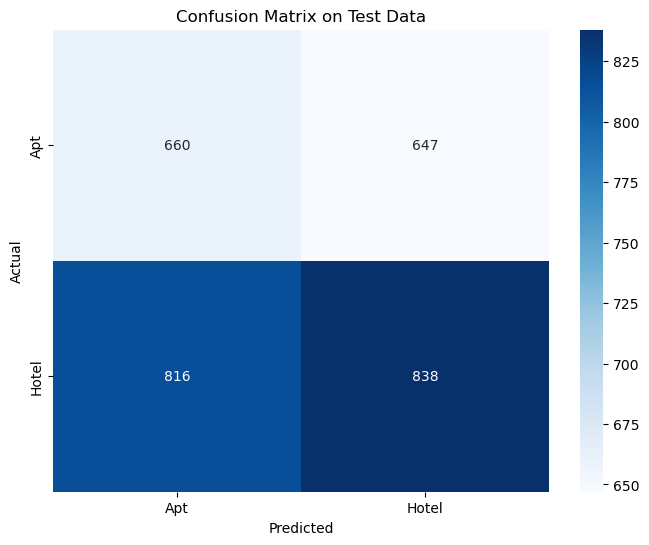

In [16]:
# Define the logistic regression model
log_reg = LogisticRegression(random_state=42, max_iter=1000)

# Hyperparameter grid for tuning
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Inverse of regularization strength
    'solver': ['liblinear', 'lbfgs'],  # Solvers for optimization
    'class_weight': ['balanced']  # Handling class imbalance
}

# Initialize GridSearchCV with f1-score as the scoring metric
grid_search = GridSearchCV(
    estimator=log_reg,
    param_grid=param_grid,
    scoring='f1_macro',  # Use f1_macro to handle class imbalance in scoring
    cv=5,  # 5-fold cross-validation
    verbose=1,
    n_jobs=-1  # Use all available processors
)

# Perform grid search on the training data
grid_search.fit(X_train_final, y_train_encoded)

# Best hyperparameters
print("Best Parameters:", grid_search.best_params_)

# Best estimator
best_log_reg = grid_search.best_estimator_

# Evaluate with 5-fold cross-validation using the best model
cv_scores = cross_val_score(best_log_reg, X_train_final, y_train_encoded, cv=5, scoring='f1_macro')
print("Cross-Validation F1-Scores:", cv_scores)
print("Mean CV F1-Score:", cv_scores.mean())

# Test the model on the test data
y_test_pred = best_log_reg.predict(X_test_final)

# Performance on the test set
f1_test = f1_score(y_test_encoded, y_test_pred, average='macro')
print("F1-Score on Test Data:", f1_test)

# Classification report
print("\nClassification Report on Test Data:\n")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_encoder.classes_))

# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print("\nConfusion Matrix on Test Data:\n", conf_matrix)

# Visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix on Test Data')
plt.show()

# Modeling (SVM)

### Data Processing

In [ ]:
# Read txt file line by line
with open("../data/train_data.txt", "r") as file:
    lines = file.readlines()

# Initialize variables
data = []
record = {}

# Iter lines
for line in lines:
    line = line.strip()  # white space and line jump
    
    # Delete [1]
    if line.startswith("[1]"):
        line = line[4:].strip()
    
    # Detect new registry
    if line.startswith('"Record'):
        if record:  
            data.append(record)
        record = {} 
    else:
        # Check registry status and assign order
        if len(record) < 7:
            key = ["id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType"][len(record)]
            record[key] = line if line != "<NA>" else None  # Reemplazar <NA> con None para pandas

# Add last register
if record:
    data.append(record)

# Create dataframe
df = pd.DataFrame(data)

# Column type
df["id"] = pd.to_numeric(df["id"], errors="coerce")
df["durationOfStay"] = pd.to_numeric(df["durationOfStay"], errors="coerce")
df["age"] = pd.to_numeric(df["age"], errors="coerce")
df["kids"] = pd.to_numeric(df["kids"], errors="coerce")


df.head()

In [ ]:
# Fill missing values
df['age'] = df['age'].fillna(df['age'].median())
df['kids'] = df['kids'].map({0: 'False', 1: 'True'})
df['kids'] = df['kids'].fillna('False') 
df['destinationCode'] = df['destinationCode'].fillna('Unknown')

# Droping variables
df.drop(columns=['id'], inplace=True)


In [ ]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

### SVM

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'C': 1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}
Cross-Validation F1-Scores: [0.75165954 0.75800422 0.74612361 0.76191626 0.75452774]
Mean CV F1-Score: 0.7544462743209592
F1-Score on Test Data: 0.755270208786209

Classification Report on Test Data:

              precision    recall  f1-score   support

         Apt       0.70      0.78      0.74      1307
       Hotel       0.81      0.74      0.77      1654

    accuracy                           0.76      2961
   macro avg       0.76      0.76      0.76      2961
weighted avg       0.76      0.76      0.76      2961


Confusion Matrix on Test Data:
 [[1015  292]
 [ 429 1225]]


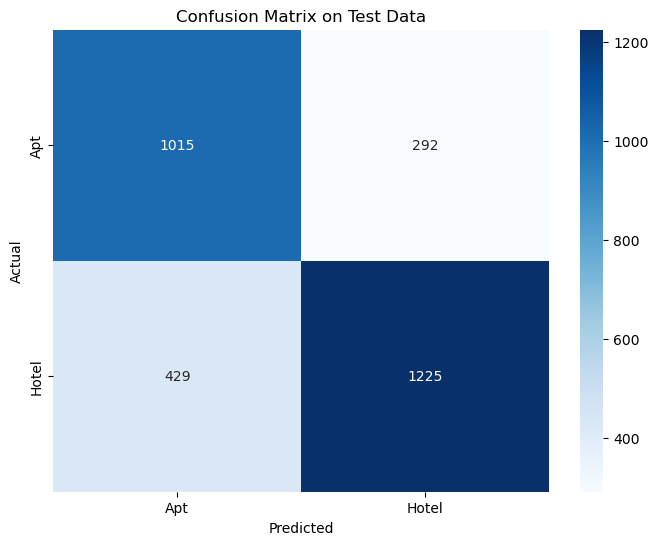

In [15]:
# Initialize the SVM model
svm_model = SVC(random_state=42)

# Define hyperparameter grid for tuning
param_grid = {
    'C': [0.1, 1, 10, 100],          # Regularization parameter
    'kernel': ['linear', 'rbf'],     # Kernel types
    'gamma': ['scale', 'auto'],      # Kernel coefficient for 'rbf'
    'class_weight': ['balanced']  # Handling class imbalance
}

# Initialize GridSearchCV with f1-score as the scoring metric
grid_search = GridSearchCV(
    estimator=svm_model,
    param_grid=param_grid,
    scoring='f1_macro',  # Use f1_macro for multiclass
    cv=5,                # 5-fold cross-validation
    verbose=1,
    n_jobs=-1            # Use all processors
)

# Perform hyperparameter tuning on the training data
grid_search.fit(X_train_final, y_train_encoded)

# Best hyperparameters
print("Best Parameters:", grid_search.best_params_)

# Best estimator
best_svm = grid_search.best_estimator_

# Evaluate the model using 5-fold cross-validation on the training data
cv_scores = cross_val_score(best_svm, X_train_final, y_train_encoded, cv=5, scoring='f1_macro')
print("Cross-Validation F1-Scores:", cv_scores)
print("Mean CV F1-Score:", cv_scores.mean())

# Test the model on the test data
y_test_pred = best_svm.predict(X_test_final)

# Performance evaluation
f1_test = f1_score(y_test_encoded, y_test_pred, average='macro')
print("F1-Score on Test Data:", f1_test)

# Generate a classification report
print("\nClassification Report on Test Data:\n")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_encoder.classes_))

# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print("\nConfusion Matrix on Test Data:\n", conf_matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix on Test Data')
plt.show()


# Modeling (Decision Tree)

### Data Processing

In [2]:
# Read txt file line by line
with open("../data/train_data.txt", "r") as file:
    lines = file.readlines()

# Initialize variables
data = []
record = {}

# Iter lines
for line in lines:
    line = line.strip()  # white space and line jump
    
    # Delete [1]
    if line.startswith("[1]"):
        line = line[4:].strip()
    
    # Detect new registry
    if line.startswith('"Record'):
        if record:  
            data.append(record)
        record = {} 
    else:
        # Check registry status and assign order
        if len(record) < 7:
            key = ["id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType"][len(record)]
            record[key] = line if line != "<NA>" else None  # Reemplazar <NA> con None para pandas

# Add last register
if record:
    data.append(record)

# Create dataframe
df = pd.DataFrame(data)

# Column type
df["id"] = pd.to_numeric(df["id"], errors="coerce")
df["durationOfStay"] = pd.to_numeric(df["durationOfStay"], errors="coerce")
df["age"] = pd.to_numeric(df["age"], errors="coerce")
df["kids"] = pd.to_numeric(df["kids"], errors="coerce")


df.head()

,id,durationOfStay,gender,age,kids,destinationCode,acomType
0,1010286,7,F,40.0,0.0,SE,Apt
1,1000152,5,M,NaN,0.0,None,Apt
2,1009019,4,F,39.0,1.0,ES,Hotel
3,1007840,5,F,45.0,0.0,NL,Hotel
4,1006939,5,M,45.0,1.0,UK,Hotel


In [3]:
# Fill missing values
df['age'] = df['age'].fillna(df['age'].median())
df['kids'] = df['kids'].map({0: 'False', 1: 'True'})
df['kids'] = df['kids'].fillna('False') 
df['destinationCode'] = df['destinationCode'].fillna('Unknown')

# Droping variables
df.drop(columns=['id'], inplace=True)

In [4]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

X_train_final:
       durationOfStay       age    0    1    2    3    4    5    6    7    8  \
0          -0.001422 -0.913379  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0   
1          -0.579079 -1.751578  1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0   
2          -0.579079  1.601219  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0   
3           1.731551 -0.075179  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0   
4          -0.001422 -0.913379  0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0   
...              ...       ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
6902       -0.001422 -0.703829  0.0  1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0   
6903       -0.579079 -0.494279  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0   
6904        0.576236 -0.913379  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0   
6905       -0.001422  0.763020  0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0   
6906        1.153893  1.391669  0.0  1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0   

        9   10   11   12  
0     0.

### Decision Tree

5-fold Cross Validation F1 Scores: [0.72546419 0.7291532  0.72021066 0.69758065 0.69980119]
Mean F1 Score (CV): 0.7144419787276453
Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 2}
Confusion Matrix:
[[ 922  385]
 [ 417 1237]]


/Users/carlosmayorga/anaconda3/envs/caso_ds/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


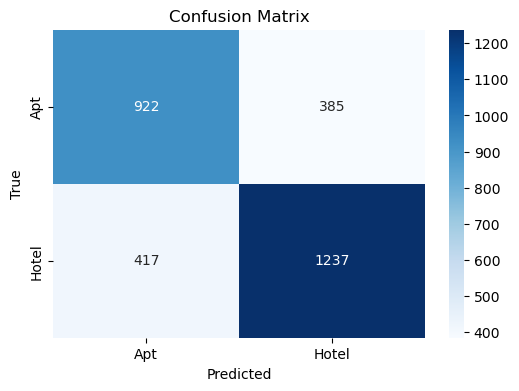

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.71      0.70      1307
           1       0.76      0.75      0.76      1654

    accuracy                           0.73      2961
   macro avg       0.73      0.73      0.73      2961
weighted avg       0.73      0.73      0.73      2961

Training F1 Score (Cross-validation): 0.7144419787276453
Testing F1 Score (from confusion matrix and classification report): 0.7551892551892552


In [7]:
# Initialize the Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)

# 5-fold Cross Validation on training data
cv_scores = cross_val_score(clf, X_train_final, y_train_encoded, cv=5, scoring='f1')

# Print the cross-validation results
print(f"5-fold Cross Validation F1 Scores: {cv_scores}")
print(f"Mean F1 Score (CV): {cv_scores.mean()}")

# Hyperparameter tuning using GridSearchCV with F1 score as metric
param_grid = {
    'max_depth': [3, 5, 7, 10, 15, 20],
    'min_samples_split': [2, 5, 7],
    'min_samples_leaf': [1, 2, 5, 7],
    'criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='f1', n_jobs=-1)
grid_search.fit(X_train_final, y_train_encoded)

# Best parameters found by GridSearchCV
print(f"Best Hyperparameters: {grid_search.best_params_}")

# Train the model with the best parameters on the whole training set
best_model = grid_search.best_estimator_

# Evaluate performance on test data
y_pred = best_model.predict(X_test_final)

# Confusion Matrix
cm = confusion_matrix(y_test_encoded, y_pred)
print("Confusion Matrix:")
print(cm)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Classification Report (Precision, Recall, F1 Score)
print("Classification Report:")
print(classification_report(y_test_encoded, y_pred))

# Compare training and testing performance (cross-validation vs. testing)
print(f"Training F1 Score (Cross-validation): {cv_scores.mean()}")
print(f"Testing F1 Score (from confusion matrix and classification report): {classification_report(y_test_encoded, y_pred, output_dict=True)['1']['f1-score']}")



# Modeling (Random Forest)

### Data Processing

In [ ]:
# Read txt file line by line
with open("../data/train_data.txt", "r") as file:
    lines = file.readlines()

# Initialize variables
data = []
record = {}

# Iter lines
for line in lines:
    line = line.strip()  # white space and line jump
    
    # Delete [1]
    if line.startswith("[1]"):
        line = line[4:].strip()
    
    # Detect new registry
    if line.startswith('"Record'):
        if record:  
            data.append(record)
        record = {} 
    else:
        # Check registry status and assign order
        if len(record) < 7:
            key = ["id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType"][len(record)]
            record[key] = line if line != "<NA>" else None  # Reemplazar <NA> con None para pandas

# Add last register
if record:
    data.append(record)

# Create dataframe
df = pd.DataFrame(data)

# Column type
df["id"] = pd.to_numeric(df["id"], errors="coerce")
df["durationOfStay"] = pd.to_numeric(df["durationOfStay"], errors="coerce")
df["age"] = pd.to_numeric(df["age"], errors="coerce")
df["kids"] = pd.to_numeric(df["kids"], errors="coerce")


df.head()

In [ ]:
# Fill missing values
df['age'] = df['age'].fillna(df['age'].median())
df['kids'] = df['kids'].map({0: 'False', 1: 'True'})
df['kids'] = df['kids'].fillna('False') 
df['destinationCode'] = df['destinationCode'].fillna('Unknown')

# Droping variables
df.drop(columns=['id'], inplace=True)

In [ ]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

### Random Forest

5-fold Cross Validation F1 Scores (Random Forest): [0.75351213 0.75849057 0.74904459 0.74951706 0.75306254]
Mean F1 Score (CV): 0.7527253777783286
Best Hyperparameters (Random Forest): {'bootstrap': True, 'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 50}
Confusion Matrix (Random Forest):
[[ 965  342]
 [ 322 1332]]


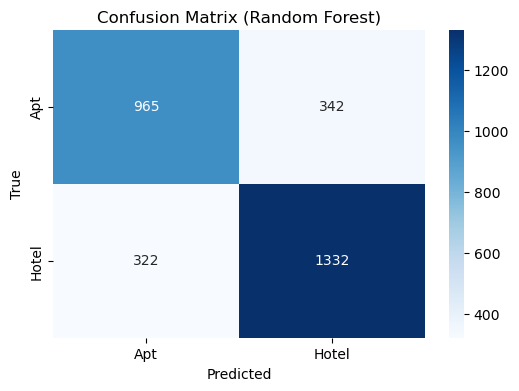

Classification Report (Random Forest):
              precision    recall  f1-score   support

           0       0.75      0.74      0.74      1307
           1       0.80      0.81      0.80      1654

    accuracy                           0.78      2961
   macro avg       0.77      0.77      0.77      2961
weighted avg       0.78      0.78      0.78      2961

Training F1 Score (Cross-validation, Random Forest): 0.7527253777783286
Testing F1 Score (from confusion matrix and classification report): 0.8004807692307693


In [10]:
# Initialize the Random Forest Classifier
rf_clf = RandomForestClassifier(random_state=42)

# 5-fold Cross Validation on training data
cv_scores_rf = cross_val_score(rf_clf, X_train_final, y_train_encoded, cv=5, scoring='f1')

# Print the cross-validation results
print(f"5-fold Cross Validation F1 Scores (Random Forest): {cv_scores_rf}")
print(f"Mean F1 Score (CV): {cv_scores_rf.mean()}")

# Hyperparameter tuning using GridSearchCV with F1 score as metric
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'criterion': ['gini', 'entropy'],
    'bootstrap': [True, False]
}

grid_search_rf = GridSearchCV(rf_clf, param_grid_rf, cv=5, scoring='f1', n_jobs=-1)
grid_search_rf.fit(X_train_final, y_train_encoded)

# Best parameters found by GridSearchCV
print(f"Best Hyperparameters (Random Forest): {grid_search_rf.best_params_}")

# Train the model with the best parameters on the whole training set
best_rf_model = grid_search_rf.best_estimator_

# Evaluate performance on test data
y_pred_rf = best_rf_model.predict(X_test_final)

# Confusion Matrix
cm_rf = confusion_matrix(y_test_encoded, y_pred_rf)
print("Confusion Matrix (Random Forest):")
print(cm_rf)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.title("Confusion Matrix (Random Forest)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Classification Report (Precision, Recall, F1 Score)
print("Classification Report (Random Forest):")
print(classification_report(y_test_encoded, y_pred_rf))

# Compare training and testing performance (cross-validation vs. testing)
print(f"Training F1 Score (Cross-validation, Random Forest): {cv_scores_rf.mean()}")
print(f"Testing F1 Score (from confusion matrix and classification report): {classification_report(y_test_encoded, y_pred_rf, output_dict=True)['1']['f1-score']}")


# Modeling (XGBoost)

### Data Processing

In [ ]:
# Read txt file line by line
with open("../data/train_data.txt", "r") as file:
    lines = file.readlines()

# Initialize variables
data = []
record = {}

# Iter lines
for line in lines:
    line = line.strip()  # white space and line jump
    
    # Delete [1]
    if line.startswith("[1]"):
        line = line[4:].strip()
    
    # Detect new registry
    if line.startswith('"Record'):
        if record:  
            data.append(record)
        record = {} 
    else:
        # Check registry status and assign order
        if len(record) < 7:
            key = ["id", "durationOfStay", "gender", "age", "kids", "destinationCode", "acomType"][len(record)]
            record[key] = line if line != "<NA>" else None  # Reemplazar <NA> con None para pandas

# Add last register
if record:
    data.append(record)

# Create dataframe
df = pd.DataFrame(data)

# Column type
df["id"] = pd.to_numeric(df["id"], errors="coerce")
df["durationOfStay"] = pd.to_numeric(df["durationOfStay"], errors="coerce")
df["age"] = pd.to_numeric(df["age"], errors="coerce")
df["kids"] = pd.to_numeric(df["kids"], errors="coerce")


df.head()

In [ ]:
# Fill missing values
df['age'] = df['age'].fillna(df['age'].median())
df['kids'] = df['kids'].map({0: 'False', 1: 'True'})
df['kids'] = df['kids'].fillna('False') 
df['destinationCode'] = df['destinationCode'].fillna('Unknown')

# Droping variables
df.drop(columns=['id'], inplace=True)

In [ ]:
# Split data into features (X) and target (y)
X = df.drop(columns=['acomType'])
y = df['acomType']

# Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize encoders and scalers
scaler = StandardScaler()
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Scale numerical columns in the training set
X_train[['durationOfStay', 'age']] = scaler.fit_transform(X_train[['durationOfStay', 'age']])
X_test[['durationOfStay', 'age']] = scaler.transform(X_test[['durationOfStay', 'age']])

# Encode categorical columns
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[['gender', 'kids', 'destinationCode']]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[['gender', 'kids', 'destinationCode']]))

# Reindex encoded columns and merge with scaled numerical columns
X_train_encoded.index = X_train.index
X_test_encoded.index = X_test.index

X_train_final = pd.concat([X_train[['durationOfStay', 'age']].reset_index(drop=True),
                           X_train_encoded.reset_index(drop=True)], axis=1)
X_test_final = pd.concat([X_test[['durationOfStay', 'age']].reset_index(drop=True),
                          X_test_encoded.reset_index(drop=True)], axis=1)

X_train_final.columns = X_train_final.columns.astype(str)
X_test_final.columns = X_test_final.columns.astype(str)

# Initialize the LabelEncoder for the target variable
target_encoder = LabelEncoder()

# Fit and transform the training set and transform the test set
y_train_encoded = target_encoder.fit_transform(y_train)
y_test_encoded = target_encoder.transform(y_test)

print("X_train_final:\n", X_train_final)
print("X_test_final:\n", X_test_final)
print("Encoded y_train:", y_train_encoded[:10])
print("Encoded y_test:", y_test_encoded[:10])

### XGBoost

5-fold Cross Validation F1 Scores (XGBoost): [0.78665828 0.79048843 0.7816092  0.79363057 0.79744409]
Mean F1 Score (CV): 0.7899661131258484


/Users/carlosmayorga/anaconda3/envs/caso_ds/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:23:35] WARNING: /var/folders/k1/30mswbxs7r1g6zwn8y4fyt500000gp/T/abs_d9k8pmaj4_/croot/xgboost-split_1724073758172/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/carlosmayorga/anaconda3/envs/caso_ds/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:23:35] WARNING: /var/folders/k1/30mswbxs7r1g6zwn8y4fyt500000gp/T/abs_d9k8pmaj4_/croot/xgboost-split_1724073758172/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/carlosmayorga/anaconda3/envs/caso_ds/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:23:35] WARNING: /var/folders/k1/30mswbxs7r1g6zwn8y4fyt500000gp/T/abs_d9k8pmaj4_/croot/xgboost-split_1724073758172/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, Us

Best Hyperparameters (XGBoost): {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'scale_pos_weight': 1, 'subsample': 0.8}
Confusion Matrix (XGBoost):
[[1015  292]
 [ 349 1305]]


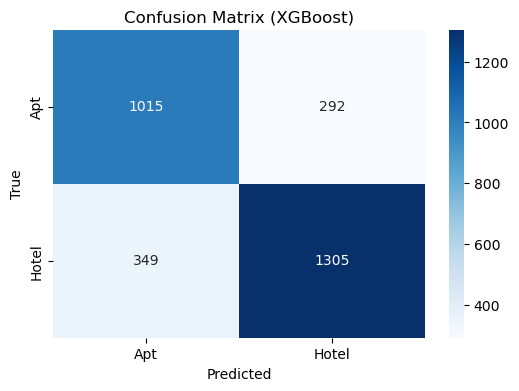

Classification Report (XGBoost):
              precision    recall  f1-score   support

           0       0.74      0.78      0.76      1307
           1       0.82      0.79      0.80      1654

    accuracy                           0.78      2961
   macro avg       0.78      0.78      0.78      2961
weighted avg       0.78      0.78      0.78      2961

Training F1 Score (Cross-validation, XGBoost): 0.7899661131258484
Testing F1 Score (from confusion matrix and classification report): 0.8028298984927714


In [14]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="xgboost")

# Initialize the XGBoost Classifier
xgb_clf = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Step 1: 5-fold Cross Validation on training data
cv_scores_xgb = cross_val_score(xgb_clf, X_train_final, y_train_encoded, cv=5, scoring='f1')

# Print the cross-validation results
print(f"5-fold Cross Validation F1 Scores (XGBoost): {cv_scores_xgb}")
print(f"Mean F1 Score (CV): {cv_scores_xgb.mean()}")

# Step 2: Hyperparameter tuning using GridSearchCV with F1 score as metric
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7, 10, 15],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.3],
    'scale_pos_weight': [1, 2]
}

grid_search_xgb = GridSearchCV(xgb_clf, param_grid_xgb, cv=5, scoring='f1', n_jobs=-1)
grid_search_xgb.fit(X_train_final, y_train_encoded)

# Best parameters found by GridSearchCV
print(f"Best Hyperparameters (XGBoost): {grid_search_xgb.best_params_}")

# Step 3: Train the model with the best parameters on the whole training set
best_xgb_model = grid_search_xgb.best_estimator_

# Step 4: Evaluate performance on test data
y_pred_xgb = best_xgb_model.predict(X_test_final)

# Confusion Matrix
cm_xgb = confusion_matrix(y_test_encoded, y_pred_xgb)
print("Confusion Matrix (XGBoost):")
print(cm_xgb)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap='Blues', xticklabels=target_encoder.classes_, yticklabels=target_encoder.classes_)
plt.title("Confusion Matrix (XGBoost)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Step 5: Classification Report (Precision, Recall, F1 Score)
print("Classification Report (XGBoost):")
print(classification_report(y_test_encoded, y_pred_xgb))

# Step 6: Compare training and testing performance (cross-validation vs. testing)
print(f"Training F1 Score (Cross-validation, XGBoost): {cv_scores_xgb.mean()}")
print(f"Testing F1 Score (from confusion matrix and classification report): {classification_report(y_test_encoded, y_pred_xgb, output_dict=True)['1']['f1-score']}")


# Summary

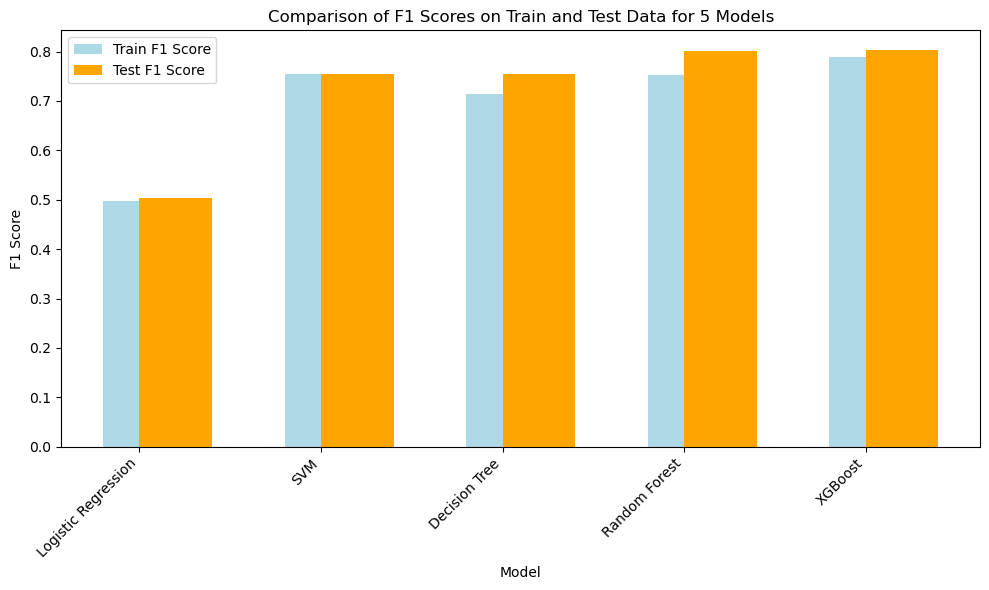

In [17]:
# Model names
models = ['Logistic Regression', 'SVM', 'Decision Tree', 'Random Forest', 'XGBoost']

# F1 scores for training and test data
train_f1_scores = [
    0.4968592105905608,  # Logistic Regression
    0.7544462743209592,  # SVM
    0.7144419787276453,  # Decision Tree
    0.7527253777783286,  # Random Forest
    0.7899661131258484   # XGBoost
]

test_f1_scores = [
    0.5041181514719196,  # Logistic Regression
    0.755270208786209,   # SVM
    0.7551892551892552,  # Decision Tree
    0.8004807692307693,  # Random Forest
    0.8028298984927714   # XGBoost
]

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Plotting training and test F1 scores
plt.bar(models, train_f1_scores, width=0.4, label='Train F1 Score', align='center', color='lightblue')
plt.bar(models, test_f1_scores, width=0.4, label='Test F1 Score', align='edge', color='orange')

# Adding titles and labels
plt.title('Comparison of F1 Scores on Train and Test Data for 5 Models')
plt.xlabel('Model')
plt.ylabel('F1 Score')
plt.legend()

# Show the plot
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

En el análisis del dataset descubrimos información valiosa para construir un modelo de clasificación. A continuación discutiremos brebemente algunos puntos de interés.

#### Valores Faltantes
Es importante notar que el origen de los registros faltantes parecen ocurrir de manera aleatoria, es decir, no hay evidencia de un proceso incorrecto de muestreo que 
introduzca un sesgo no contemplado en los datos. Además, la proporción de resgitros faltantes es pequeña, por lo que no causará un efecto considerable hacer imputaciones.
Esto nos permite identificar el mejor modo para realizar imputaciones, en este caso se hicieron las siguientes:
- Para los registros con 'kids' faltante, se consideró que no había niños.
- Para los registros con 'age' faltante, se usó la media calculada con los resgistros disponibles.
- Para los registros con 'destinationCode' se usó una variable nueva, 'UNKNOWN', que denota que no se sabe el destino del viaje para evitar inducir un sesgo hacia una clase particular.



#### Outliers
También, del ánalisis exploratorio se puede observar que los outliers no son errores y no representan un peligro. Más bien, estos outliers contienen información importante que puede ser útil en las etapas de modelado.




#### Procesamiento de los Datos
Ahora discutiremos el procesamiento de los datos. La variable 'id' fue eliminada completamente ya que no aporta información para el modelado, esto se debe a que esta una variable que se genera automaticamente para cada registro.
Dentro de las 6 variables restantes sólo 2 no son categoricas, 'durationOfStay' y 'age', estas variables fueron estandarizadas. Este tratamiento facilita el entrenamiento de modelos líneales (RL).
Finalmente, debido a que se utilizaron modelos que no admiten variables categoricas (RL y SVM) se uso one-hot encoding para generar variables numericas. 

#### Modelado
La métrica objetivo es el F1-Score ya que no considero que alguna de las dos clases de la variable objetivo tenga una mayor importancia para nosotros.
Se ajustaron 5 modelos, discutiremos cada uno de manera breve:
- Regresión Logística: Se puede observar que el performance de este modelo, tanto en entrenamiento como en testing, es bastante malo. Esto es un indicador de que las relaciones entre las variables no son lineales y por lo tanto este modelos es muy simple para identificar patrones útiles en los datos.
- SVM: Este modelo tuvo un performance moderado, alrededor de un 70% de F1 Score. Analizando el desempeño en entramiento como en testing podemos observar que no hay un sobreajuste, simplemente el modelo ess rígido y el sesgo del modelo es más grande de lo que nos gustaría.
- Decision Tree: Podemos ver un comportamiento pareceido al modelo anterior. Existe un subajuste debido a la falata de complejidad en el modelo utilizado.
- Random Forest: Hay una mejoría en el performance pero no es grande, tiene un costo de recursos mayor paro sigue siendo un costo razonable.
- XGBoost: Mejora un poco más pero el costo en tiempo aumenta, sigue siendo algo razonable. Es el modelo con mejor desempeño.